In [2]:
import os
import matplotlib.pyplot as plt
import cv2
import pandas as pd
import numpy as np
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, BatchNormalization, Dropout
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras import backend as K
from sklearn.metrics import confusion_matrix, classification_report
import seaborn as sns
import skimage


import warnings
warnings.filterwarnings('ignore')


In [3]:
# The Path of the dataset
train_data_path = r'G:\Agriconnect\dataset'

# Determine the Categories of the dataset
categories = os.listdir(train_data_path)
print(f'The Number Of categories are : {len(categories)} Category')


The Number Of categories are : 38 Category


In [5]:
# Explore the number of images at each Catgory
cat_freq = {}
for cat in categories:
    cat_freq[cat] = len(os.listdir(train_data_path + '\\' + cat))

# Create A dataframe 
cat_freq_df = pd.DataFrame.from_dict(cat_freq, orient='index', columns=['Frequencies'])

# Rename the index column to "Categories"
cat_freq_df.reset_index(inplace=True)
cat_freq_df.columns = ['Categories', 'Frequencies']
cat_freq_df


,Categories,Frequencies
0,Apple___Apple_scab,2016
1,Apple___Black_rot,1987
2,Apple___Cedar_apple_rust,1760
3,Apple___healthy,2008
4,Blueberry___healthy,1816
5,Cherry_(including_sour)___healthy,1826
6,Cherry_(including_sour)___Powdery_mildew,1683
7,Corn_(maize)___Cercospora_leaf_spot Gray_leaf_...,1642
8,Corn_(maize)___Common_rust_,1907
9,Corn_(maize)___healthy,1859


In [6]:
cat_freq_df.describe()


,Frequencies
count,38.000000
mean,1849.868421
std,105.724315
min,1642.000000
25%,1763.500000
50%,1844.500000
75%,1924.500000
max,2022.000000


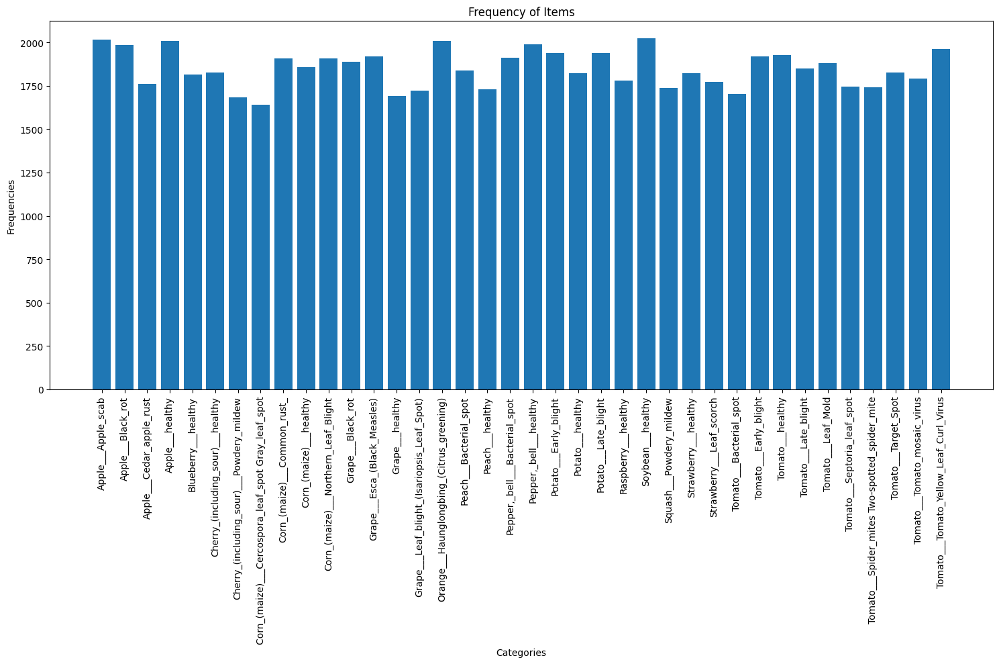

In [7]:
# Create a side bar chart
plt.figure(figsize=(15, 10))
plt.bar(cat_freq_df['Categories'], cat_freq_df['Frequencies'])
plt.xlabel('Categories')
plt.ylabel('Frequencies')
plt.title('Frequency of Items')
plt.xticks(rotation=90)  # Rotate x-axis labels for better readability
plt.tight_layout()
plt.show()


In [8]:
# Determine the Fruits and vegetables that the dataset are about
fruits_veg = []
for cat in categories:
    fruits_veg.append(cat.split('___')[0])
unique_fruites_veg = list(np.unique(fruits_veg))

# Print the number of fruits and vegetables detected
print(f'The represents {len(unique_fruites_veg)} Different types of Fruits and Vegetables as follows : ')
unique_fruites_veg


The represents 14 Different types of Fruits and Vegetables as follows : 


['Apple',
 'Blueberry',
 'Cherry_(including_sour)',
 'Corn_(maize)',
 'Grape',
 'Orange',
 'Peach',
 'Pepper,_bell',
 'Potato',
 'Raspberry',
 'Soybean',
 'Squash',
 'Strawberry',
 'Tomato']

In [9]:
# Create A dictionary shows how many class belongs to each veg or fruit
veg_fruite_cat = {}
for i in unique_fruites_veg:
    num = 0
    for j in categories:
        if i in j:
            num +=1
    veg_fruite_cat[i] = num
veg_fruite_cat


{'Apple': 4,
 'Blueberry': 1,
 'Cherry_(including_sour)': 2,
 'Corn_(maize)': 4,
 'Grape': 4,
 'Orange': 1,
 'Peach': 2,
 'Pepper,_bell': 2,
 'Potato': 3,
 'Raspberry': 1,
 'Soybean': 1,
 'Squash': 1,
 'Strawberry': 2,
 'Tomato': 10}

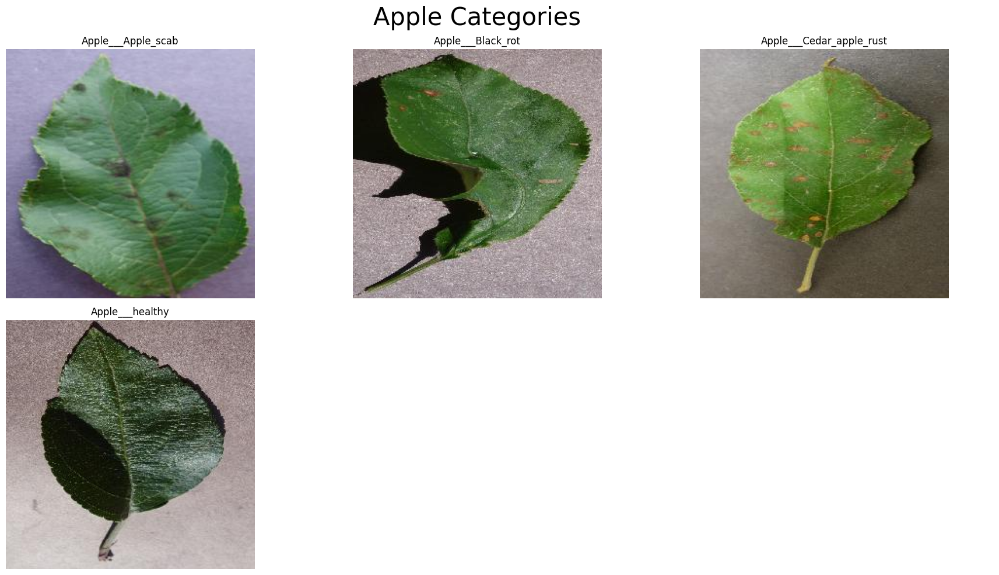

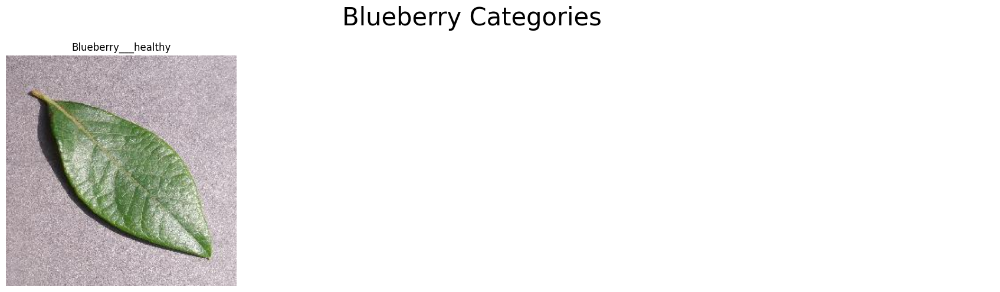

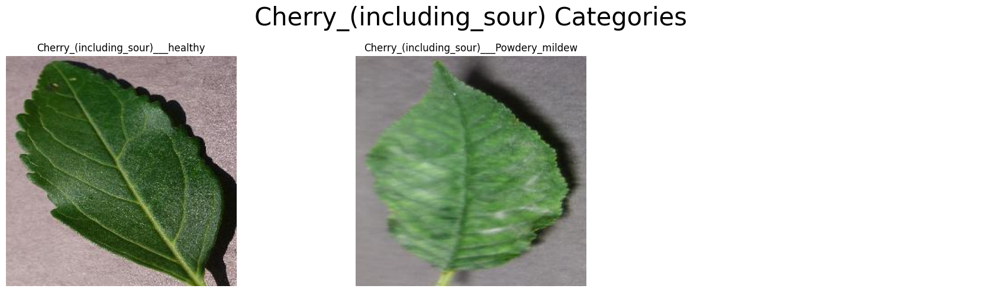

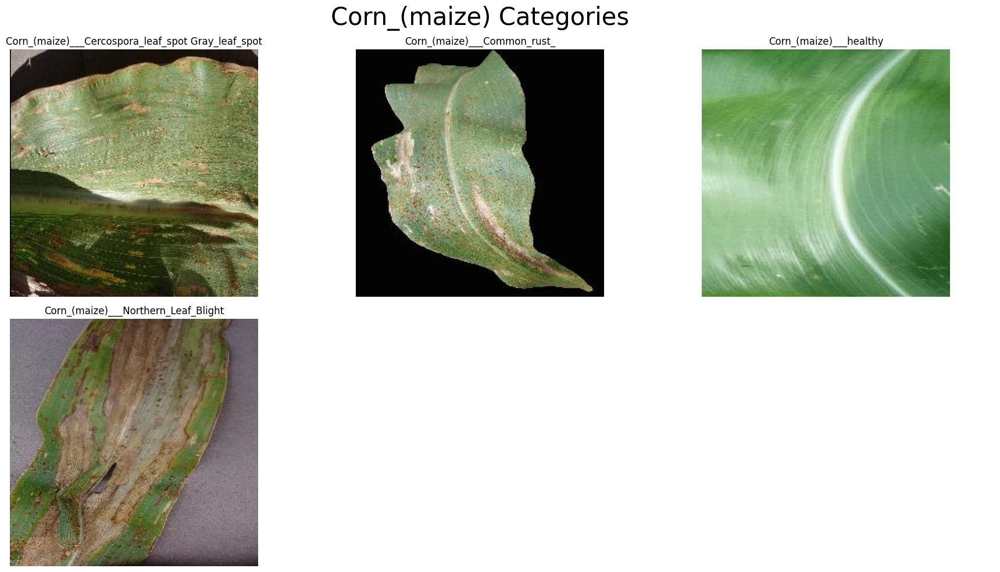

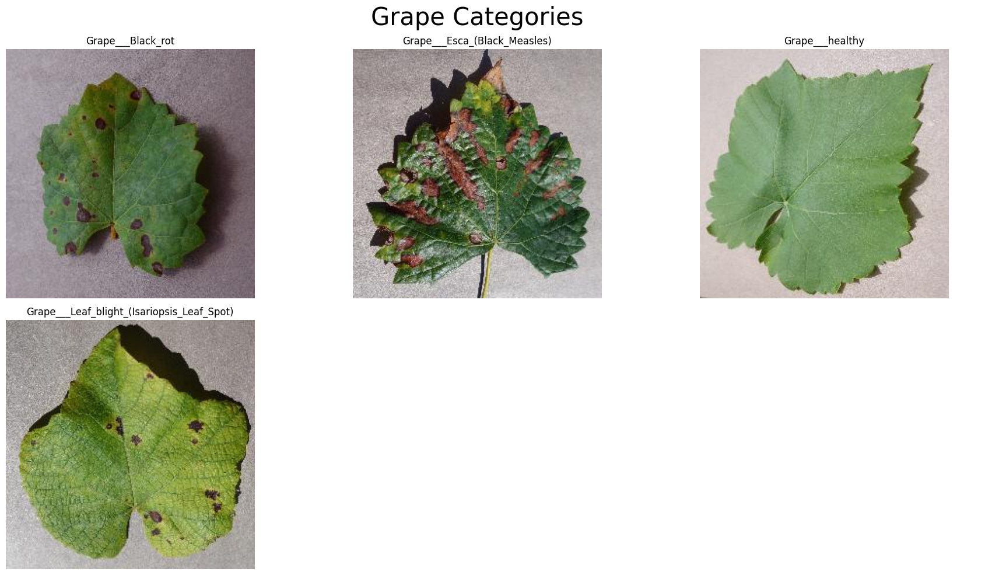

...

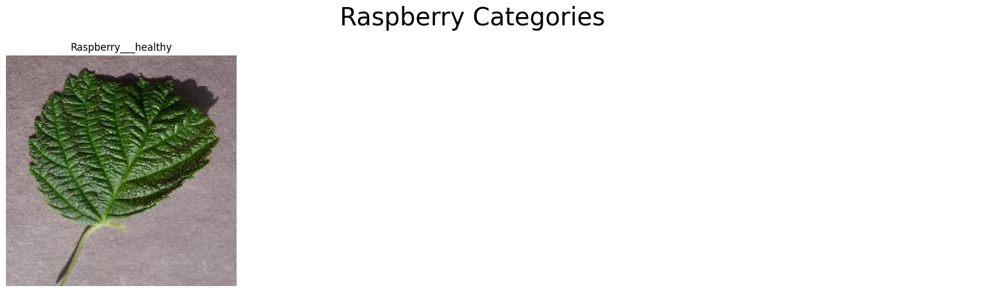

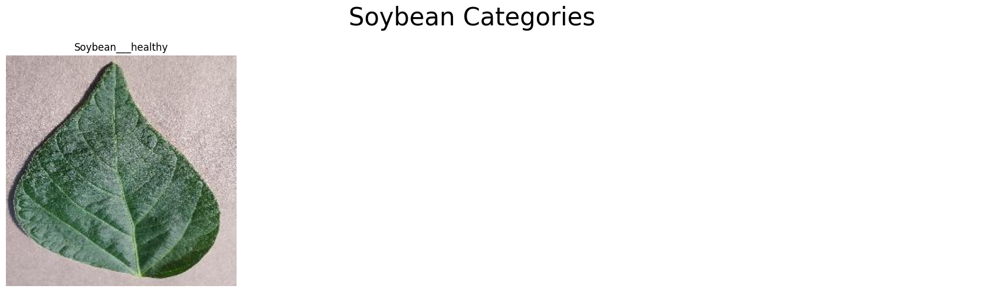

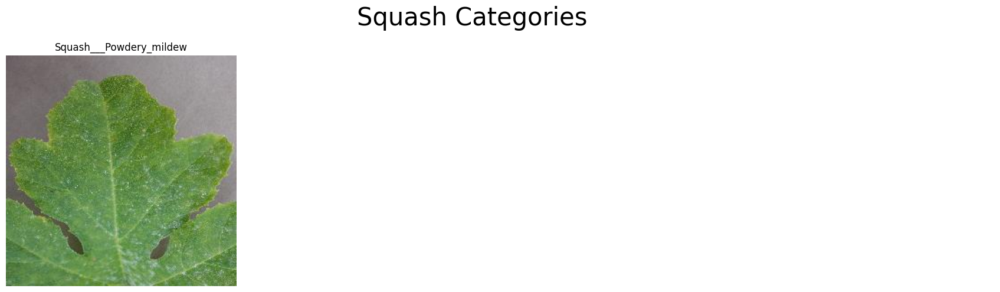

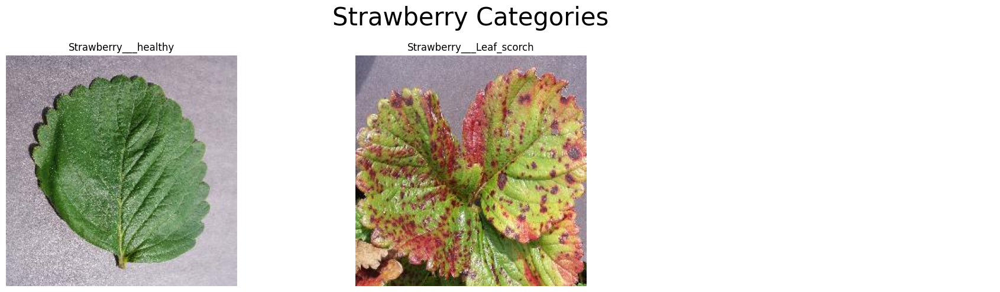

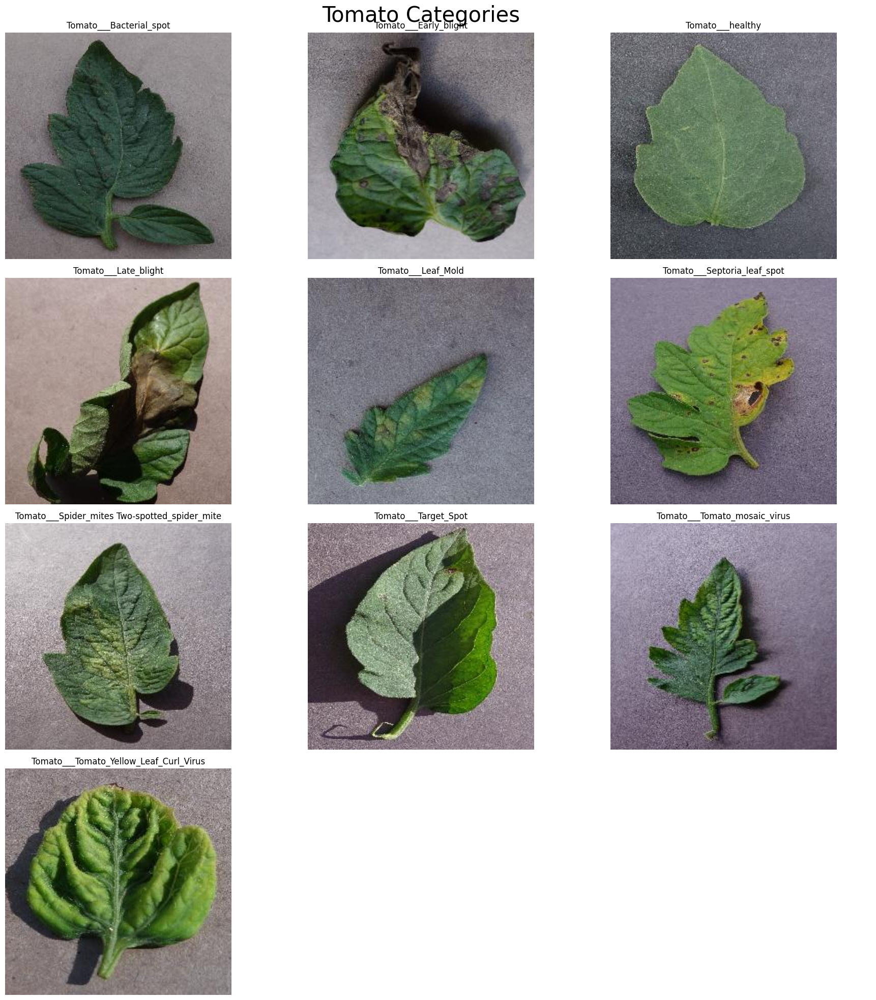

In [10]:
for i in veg_fruite_cat:
    
    # Define the num columns
    num_cols = 3

    # Calculate the number of rows required
    num_rows = int(np.ceil(veg_fruite_cat[i]/num_cols))

    # Create a figure for the subplots
    fig, axes = plt.subplots(num_rows, num_cols, figsize=(18, 5 * num_rows))
    axes = axes.flatten()
    fig.suptitle(f'{i} Categories',fontsize=30)
    plt_num = 0
    for j in categories:
    
        if i in j:
            # Construct the subcategory path
            subcategory_path = os.path.join(train_data_path, j)

            # Load a sample image from the subcategory
            sample_image = os.listdir(subcategory_path)[0]
            image_path = os.path.join(subcategory_path, sample_image)
            image = cv2.imread(image_path)


            # Convert the image from BGR to RGB
            image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        
            # Plot the image
            ax = axes[plt_num]
            ax.imshow(image_rgb)
            ax.set_title(f'{j}')
            ax.axis('off')
            plt_num +=1
    # Hide any unused subplots
    for i in range(plt_num, len(axes)):
        axes[i].axis('off')

    plt.tight_layout()
    plt.show()


In [22]:
# image_sizes = []

# # Iterate through each category and subcategory
# for i in categories:
#     # Construct the subcategory path
#     subcategory_path = os.path.join(train_data_path,i)
                                    
#     # List all images in the subcategory
#     image_files = os.listdir(subcategory_path)
#     for image_file in image_files:
#         # Load the image
#         image_path = os.path.join(subcategory_path, image_file)
#         image = cv2.imread(image_path)
#         if image is not None:
#             # Get the dimensions of the image
#             height, width, _ = image.shape
#             # Append the dimensions to the list
#             image_sizes.append((width, height))

# # Print the list of image sizes
# print(image_sizes)
# # This shows that the dataset size is 256 * 256 * 3


KeyboardInterrupt: 

In [12]:
content_path = r'G:\Agriconnect\model'
exported_model_path = content_path + 'exported-models/'

try:
    os.mkdir(content_path)
    print("Created workspace")
    
except FileExistsError :
    print("workspace directory already exists: creating rest of the structure inside workspace")

try:
    os.mkdir(exported_model_path)
    print("full directory structure creation done")
    
except FileExistsError :
    print("directory structure already exists: Will be using existing directories")


workspace directory already exists: creating rest of the structure inside workspace
full directory structure creation done


In [23]:
# # Initialize TPU
# resolver = tf.distribute.cluster_resolver.TPUClusterResolver()
# tf.config.experimental_connect_to_cluster(resolver)
# tf.tpu.experimental.initialize_tpu_system(resolver)
# strategy = tf.distribute.TPUStrategy(resolver)


In [61]:
# with strategy.scope():
# Define the CNN model
input_shape = (256, 256, 3)  # Adjust according to your preprocessed image dimensions
num_classes = 38  # Number of classes in the New Plant Diseases Dataset

model = Sequential()

# Convolutional layer
model.add(Conv2D(32, (3, 3), activation='relu', input_shape=input_shape))
# Max Pooling layer
model.add(MaxPooling2D(pool_size=(3, 3)))

# Convolutional layer
model.add(Conv2D(64, (3, 3), activation='relu'))
# Max Pooling layer
model.add(MaxPooling2D(pool_size=(3, 3)))

# Convolutional layer
model.add(Conv2D(128, (3, 3), activation='relu'))
# Max Pooling layer
model.add(MaxPooling2D(pool_size=(3, 3)))
model.add(Dropout(0.2))

# Flatten layer
model.add(Flatten())

# Dense layer
model.add(Dense(256, activation='relu'))

# Dropout layer
model.add(Dropout(0.5))

# Output layer
model.add(Dense(num_classes, activation='softmax'))


In [64]:
# with strategy.scope():
# Compile the model with custom metrics
model.compile(
    optimizer='adam',
    loss='categorical_crossentropy',
    metrics=[
        'accuracy', 
        tf.keras.metrics.Precision(name='precision'),
        tf.keras.metrics.Recall(name='recall')
    ]
)

# Summary of the model
model.summary()


Model: "sequential_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_15 (Conv2D)          (None, 254, 254, 32)      896       
                                                                 
 max_pooling2d_15 (MaxPooli  (None, 84, 84, 32)        0         


 ng2D)                                                           
                                                                 
 conv2d_16 (Conv2D)          (None, 82, 82, 64)        18496     
                                                                 
 max_pooling2d_16 (MaxPooli  (None, 27, 27, 64)        0         
 ng2D)                                                           
                                                                 
 conv2d_17 (Conv2D)          (None, 25, 25, 128)       73856     
                                                                 
 max_pooling2d_17 (MaxPooli  (None, 8, 8, 128)         0         
 ng2D)                                                           
                                                                 
 dropout_10 (Dropout)        (None, 8, 8, 128)         0         
                                                                 
 flatten_5 (Flatten)         (None, 8192)              0         
          

In [67]:
processed_train_dir = r'G:\Agriconnect\dataset'
processed_val_dir = r'G:\Agriconnect\valid'

# Prepare data generators
train_datagen = ImageDataGenerator(
    rescale=1./255  # Rescale pixel values to [0, 1]
)

validation_datagen = ImageDataGenerator(
    rescale=1./255  # Rescale pixel values to [0, 1]
)


# Create data generators
train_generator = train_datagen.flow_from_directory(
    processed_train_dir,
    target_size=(256, 256),  # Resize images to match model input  224*224
    batch_size=32,
    class_mode='categorical',  # Use categorical labels
    shuffle=True

)

validation_generator = validation_datagen.flow_from_directory(
    processed_val_dir,
    target_size=(256, 256),  # Resize images to match model input 224*224
    batch_size=32,
    class_mode='categorical',  # Use categorical labels
    shuffle=False
)


Found 70295 images belonging to 38 classes.
Found 17572 images belonging to 38 classes.


In [69]:
# Train the model
history = model.fit(
    train_generator,
    epochs=10,
    validation_data=validation_generator
)


Epoch 1/10
2197/2197 [==============================] - 2779s 1s/step - loss: 1.0246 - accuracy: 0.6878 - precision: 0.8220 - recall: 0.5737 - val_loss: 0.4297 - val_accuracy: 0.8613 - val_precision: 0.9073 - val_recall: 0.8178
Epoch 2/10
2197/2197 [==============================] - 2584s 1s/step - loss: 0.5260 - accuracy: 0.8338 - precision: 0.8848 - recall: 0.7884 - val_loss: 0.2282 - val_accuracy: 0.9276 - val_precision: 0.9482 - val_recall: 0.9070
Epoch 3/10
2197/2197 [==============================] - 2599s 1s/step - loss: 0.3743 - accuracy: 0.8797 - precision: 0.9105 - recall: 0.8528 - val_loss: 0.2158 - val_accuracy: 0.9279 - val_precision: 0.9451 - val_recall: 0.9128
Epoch 4/10
2197/2197 [==============================] - 2553s 1s/step - loss: 0.2988 - accuracy: 0.9040 - precision: 0.9249 - recall: 0.8852 - val_loss: 0.1454 - val_accuracy: 0.9515 - val_precision: 0.9624 - val_recall: 0.9424
Epoch 5/10
2197/2197 [==============================] - 2529s 1s/step - loss: 0.2489 - a

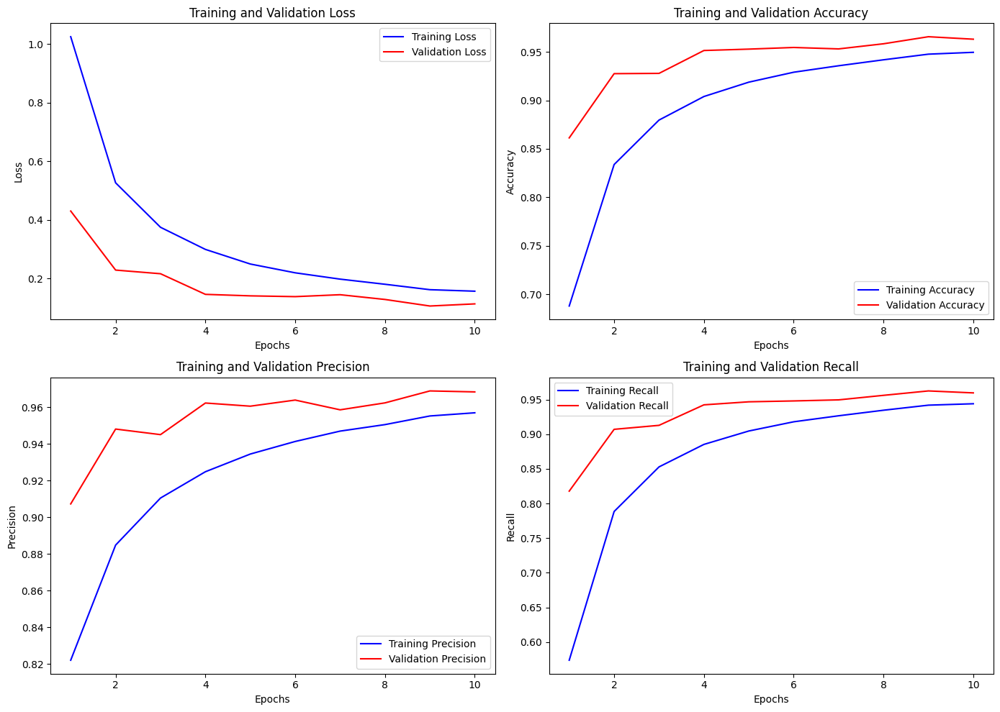

In [70]:
import matplotlib.pyplot as plt

# Extract the metrics from the history object
loss = history.history['loss']
val_loss = history.history['val_loss']
accuracy = history.history['accuracy']
val_accuracy = history.history['val_accuracy']
precision = history.history['precision']
val_precision = history.history['val_precision']
recall = history.history['recall']
val_recall = history.history['val_recall']

epochs = range(1, len(loss) + 1)

# Plot Loss
plt.figure(figsize=(14, 10))

plt.subplot(2, 2, 1)
plt.plot(epochs, loss, 'b', label='Training Loss')
plt.plot(epochs, val_loss, 'r', label='Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

# Plot Accuracy
plt.subplot(2, 2, 2)
plt.plot(epochs, accuracy, 'b', label='Training Accuracy')
plt.plot(epochs, val_accuracy, 'r', label='Validation Accuracy')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()

# Plot Precision
plt.subplot(2, 2, 3)
plt.plot(epochs, precision, 'b', label='Training Precision')
plt.plot(epochs, val_precision, 'r', label='Validation Precision')
plt.title('Training and Validation Precision')
plt.xlabel('Epochs')
plt.ylabel('Precision')
plt.legend()

# Plot Recall
plt.subplot(2, 2, 4)
plt.plot(epochs, recall, 'b', label='Training Recall')
plt.plot(epochs, val_recall, 'r', label='Validation Recall')
plt.title('Training and Validation Recall')
plt.xlabel('Epochs')
plt.ylabel('Recall')
plt.legend()

plt.tight_layout()
plt.show()


In [73]:
# Save the trained model
model.save('G:\Agriconnect\modelplant_disease_cnn_model.h5')


In [74]:
# Load the trained model
loaded_model = tf.keras.models.load_model('G:\Agriconnect\modelplant_disease_cnn_model.h5', custom_objects={
    'precision': tf.keras.metrics.Precision(),
    'recall': tf.keras.metrics.Recall()
})


550/550 [==============================] - 311s 566ms/step


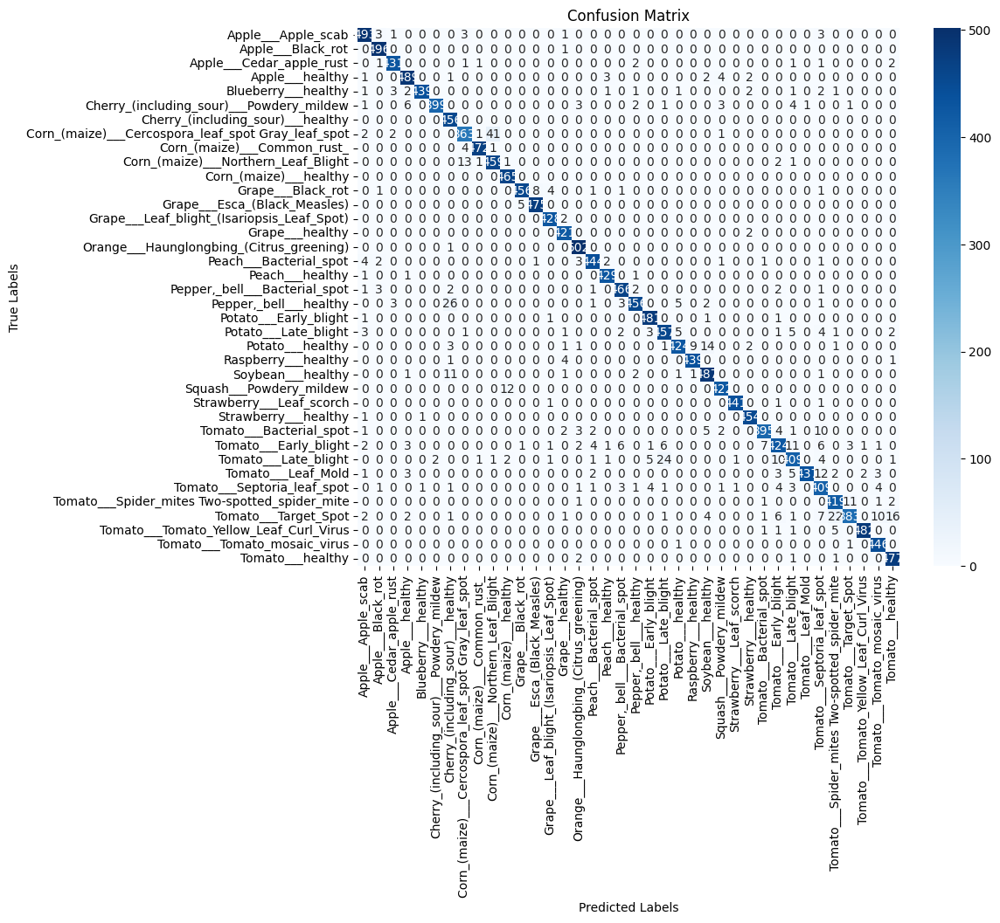

In [75]:
# Predict on validation data
validation_steps = validation_generator.n // validation_generator.batch_size
predictions = model.predict(validation_generator, steps=validation_steps+1)
predicted_classes = np.argmax(predictions, axis=1)

# True labels
true_classes = validation_generator.classes

# Class labels
class_labels = list(validation_generator.class_indices.keys())

# Compute the confusion matrix
conf_matrix = confusion_matrix(true_classes, predicted_classes)

# Plot the confusion matrix
plt.figure(figsize=(10, 8))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=class_labels, yticklabels=class_labels)
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix')
plt.show()


In [76]:
# Generate the classification report
class_report = classification_report(true_classes, predicted_classes, target_names=class_labels)
print("Classification Report:")
print(class_report)


Classification Report:
                                                    precision    recall  f1-score   support

                                Apple___Apple_scab       0.96      0.98      0.97       504
                                 Apple___Black_rot       0.98      1.00      0.99       497
                          Apple___Cedar_apple_rust       0.98      0.98      0.98       440
                                   Apple___healthy       0.96      0.97      0.97       502
                               Blueberry___healthy       1.00      0.97      0.98       454
          Cherry_(including_sour)___Powdery_mildew       1.00      0.95      0.97       421
                 Cherry_(including_sour)___healthy       0.91      1.00      0.95       456
Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot       0.94      0.89      0.91       410
                       Corn_(maize)___Common_rust_       0.99      0.99      0.99       477
               Corn_(maize)___Northern_Leaf_Blight      

In [77]:
# Directory containing test images
test_dir = r'G:\Agriconnect\test\test'  # Replace with the path to your test folder

# Get list of test images
test_images = [f for f in os.listdir(test_dir) if os.path.isfile(os.path.join(test_dir, f))]

# Print the List of test images
print(f'Test Folder contains {len(test_images)} as follows')
test_images


Test Folder contains 33 as follows


['AppleCedarRust1.JPG',
 'AppleCedarRust2.JPG',
 'AppleCedarRust3.JPG',
 'AppleCedarRust4.JPG',
 'AppleScab1.JPG',
 'AppleScab2.JPG',
 'AppleScab3.JPG',
 'CornCommonRust1.JPG',
 'CornCommonRust2.JPG',
 'CornCommonRust3.JPG',
 'PotatoEarlyBlight1.JPG',
 'PotatoEarlyBlight2.JPG',
 'PotatoEarlyBlight3.JPG',
 'PotatoEarlyBlight4.JPG',
 'PotatoEarlyBlight5.JPG',
 'PotatoHealthy1.JPG',
 'PotatoHealthy2.JPG',
 'TomatoEarlyBlight1.JPG',
 'TomatoEarlyBlight2.JPG',
 'TomatoEarlyBlight3.JPG',
 'TomatoEarlyBlight4.JPG',
 'TomatoEarlyBlight5.JPG',
 'TomatoEarlyBlight6.JPG',
 'TomatoHealthy1.JPG',
 'TomatoHealthy2.JPG',
 'TomatoHealthy3.JPG',
 'TomatoHealthy4.JPG',
 'TomatoYellowCurlVirus1.JPG',
 'TomatoYellowCurlVirus2.JPG',
 'TomatoYellowCurlVirus3.JPG',
 'TomatoYellowCurlVirus4.JPG',
 'TomatoYellowCurlVirus5.JPG',
 'TomatoYellowCurlVirus6.JPG']

In [80]:
# Function to preprocess a single image
def preprocess_image(image_path):
    image = skimage.io.imread(image_path)    
    image_array = np.array(image) / 255.0  # Normalize to [0,1]
    return np.expand_dims(image_array, axis=0)  # Add batch dimension


In [ ]:
# from PIL import Image
# import os

# # Define paths
# input_folder = r'G:\Agriconnect\test\test'  
# output_folder = r'G:\Agriconnect\test64x64' 

# # Create output folder if it doesn't exist
# if not os.path.exists(output_folder):
#     os.makedirs(output_folder)

# # Resize images
# for filename in os.listdir(input_folder):
#     if filename.lower().endswith(('png', 'jpg', 'jpeg', 'bmp', 'gif')):
#         img_path = os.path.join(input_folder, filename)
#         try:
#             with Image.open(img_path) as img:
#                 img = img.resize((64, 64), Image.Resampling.LANCZOS)
#                 img.save(os.path.join(output_folder, filename))
#                 print(f'Resized and saved {filename} to {output_folder}')
#         except Exception as e:
#             print(f'Error processing {filename}: {e}')


In [81]:
# Dictionary to hold the results
results = {}

# Iterate over the test images and make predictions
for img_name in test_images:
    img_path = os.path.join(test_dir, img_name)
    img = preprocess_image(img_path)
    
    # Predict the class
    predictions = model.predict(img)
    predicted_class = np.argmax(predictions, axis=1)[0]
    
    # Store the result
    results[img_name] = predicted_class


1/1 [==============================] - 0s 68ms/step


In [82]:
# Print the results
for img_name, predicted_class in results.items():
    print(f"Image: {img_name}, Predicted Class: {predicted_class}")


Image: AppleCedarRust1.JPG, Predicted Class: 2
Image: AppleCedarRust2.JPG, Predicted Class: 2
Image: AppleCedarRust3.JPG, Predicted Class: 2
Image: AppleCedarRust4.JPG, Predicted Class: 2
Image: AppleScab1.JPG, Predicted Class: 32
Image: AppleScab2.JPG, Predicted Class: 0
Image: AppleScab3.JPG, Predicted Class: 7
Image: CornCommonRust1.JPG, Predicted Class: 8
Image: CornCommonRust2.JPG, Predicted Class: 8
Image: CornCommonRust3.JPG, Predicted Class: 8
Image: PotatoEarlyBlight1.JPG, Predicted Class: 20
Image: PotatoEarlyBlight2.JPG, Predicted Class: 20
Image: PotatoEarlyBlight3.JPG, Predicted Class: 24
Image: PotatoEarlyBlight4.JPG, Predicted Class: 20
Image: PotatoEarlyBlight5.JPG, Predicted Class: 20
Image: PotatoHealthy1.JPG, Predicted Class: 22
Image: PotatoHealthy2.JPG, Predicted Class: 22
Image: TomatoEarlyBlight1.JPG, Predicted Class: 29
Image: TomatoEarlyBlight2.JPG, Predicted Class: 30
Image: TomatoEarlyBlight3.JPG, Predicted Class: 29
Image: TomatoEarlyBlight4.JPG, Predicted C

In [83]:
# Get the class indices mapping from the training generator
class_indices = train_generator.class_indices
# Reverse the class indices to get the category names from class index
class_indices = {v: k for k, v in class_indices.items()}

# Update results to include the category names
results = {img_name: class_indices[predicted_class] for img_name, predicted_class in results.items()}

# Print the results with category names
for img_name, predicted_category in results.items():
    print(f"Image: {img_name}, Predicted Category: {predicted_category}")


Image: AppleCedarRust1.JPG, Predicted Category: Apple___Cedar_apple_rust
Image: AppleCedarRust2.JPG, Predicted Category: Apple___Cedar_apple_rust
Image: AppleCedarRust3.JPG, Predicted Category: Apple___Cedar_apple_rust
Image: AppleCedarRust4.JPG, Predicted Category: Apple___Cedar_apple_rust
Image: AppleScab1.JPG, Predicted Category: Tomato___Septoria_leaf_spot
Image: AppleScab2.JPG, Predicted Category: Apple___Apple_scab
Image: AppleScab3.JPG, Predicted Category: Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot
Image: CornCommonRust1.JPG, Predicted Category: Corn_(maize)___Common_rust_
Image: CornCommonRust2.JPG, Predicted Category: Corn_(maize)___Common_rust_
Image: CornCommonRust3.JPG, Predicted Category: Corn_(maize)___Common_rust_
Image: PotatoEarlyBlight1.JPG, Predicted Category: Potato___Early_blight
Image: PotatoEarlyBlight2.JPG, Predicted Category: Potato___Early_blight
Image: PotatoEarlyBlight3.JPG, Predicted Category: Soybean___healthy
Image: PotatoEarlyBlight4.JPG, Predict

In [84]:
# Create the DataFrame
df = pd.DataFrame(list(results.items()), columns=['The True Class', 'The Predicted Class'])
df


,The True Class,The Predicted Class
0,AppleCedarRust1.JPG,Apple___Cedar_apple_rust
1,AppleCedarRust2.JPG,Apple___Cedar_apple_rust
2,AppleCedarRust3.JPG,Apple___Cedar_apple_rust
3,AppleCedarRust4.JPG,Apple___Cedar_apple_rust
4,AppleScab1.JPG,Tomato___Septoria_leaf_spot
5,AppleScab2.JPG,Apple___Apple_scab
6,AppleScab3.JPG,Corn_(maize)___Cercospora_leaf_spot Gray_leaf_...
7,CornCommonRust1.JPG,Corn_(maize)___Common_rust_
8,CornCommonRust2.JPG,Corn_(maize)___Common_rust_
9,CornCommonRust3.JPG,Corn_(maize)___Common_rust_


In [2]:
# Get the class indices mapping from the training generator
class_indices = train_generator.class_indices
# Reverse the class indices to get the category names from class index
class_indices = {v: k for k, v in class_indices.items()}

# Predict and plot one image
image_name = test_images[0]  # Select the first image for demonstration
image_path = os.path.join(test_dir, image_name)
preprocessed_image = preprocess_image(image_path)

# Make prediction
predictions = model.predict(preprocessed_image)
predicted_class_idx = np.argmax(predictions, axis=1)[0]
predicted_class = class_indices[predicted_class_idx]


NameError: name 'train_generator' is not defined